In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

In [2]:
df = pd.read_csv('Car_details_v3.csv')

In [3]:
df.sample(5)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
4052,Renault Fluence Diesel E4,2012,500000,120000,Diesel,Individual,Manual,Second Owner,21.8 kmpl,1461 CC,78 bhp,240Nm@ 2000rpm,5.0
6379,Tata Nexon 1.2 Revotron XM,2018,625000,25000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1198 CC,108.5 bhp,170Nm@ 1750-4000rpm,5.0
6812,Hyundai Creta 1.4 CRDi S,2016,900000,130000,Diesel,Individual,Manual,First Owner,21.38 kmpl,1396 CC,88.7 bhp,219.7Nm@ 1500-2750rpm,5.0
6658,Mahindra TUV 300 T8,2015,500000,120000,Diesel,Individual,Manual,First Owner,18.49 kmpl,1493 CC,100 bhp,240Nm@ 1600-2800rpm,7.0
5904,Honda City i-DTEC ZX,2017,1050000,50000,Diesel,Individual,Manual,First Owner,25.6 kmpl,1498 CC,97.9 bhp,200Nm@ 1750rpm,5.0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [5]:
df['Brand'] = df.iloc[:, 0].apply(lambda x: str(x).split()[0] if pd.notna(x) else "")

In [6]:
# df['Name'] = df['name'].apply(lambda x: "".join(x.split()[1:]) if pd.notna(x) else "")
df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))

In [7]:
df['model']

0              Swift Dzire VDI
1       Rapid 1.5 TDI Ambition
2           City 2017-2020 EXi
3            i20 Sportz Diesel
4              Swift VXI BSIII
                 ...          
8123                 i20 Magna
8124             Verna CRDi SX
8125           Swift Dzire ZDi
8126                Indigo CR4
8127                Indigo CR4
Name: model, Length: 8128, dtype: object

In [8]:
df.drop(columns='name',axis=1,inplace=True)

In [9]:
df.isnull().sum()

year               0
selling_price      0
km_driven          0
fuel               0
seller_type        0
transmission       0
owner              0
mileage          221
engine           221
max_power        215
torque           222
seats            221
Brand              0
model              0
dtype: int64

In [10]:
df.shape

(8128, 14)

In [11]:
df_new = df.copy()

In [12]:
df_new =df_new.dropna()

In [13]:
df_new.isnull().sum()

year             0
selling_price    0
km_driven        0
fuel             0
seller_type      0
transmission     0
owner            0
mileage          0
engine           0
max_power        0
torque           0
seats            0
Brand            0
model            0
dtype: int64

In [14]:
df_new.shape

(7906, 14)

In [15]:
df_new

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,19.3 kmpl,1248 CC,73.9 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70 bhp,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4


In [16]:
str(df_new.iloc[0,8]).split()[0]

'1248'

In [17]:
df_new['Engine_data'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")
df_new['Engine_CC'] = df_new.iloc[:, 8].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [18]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [19]:
df_new.drop(columns='engine',inplace=True)

In [20]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC


In [21]:
df_new['Mileage_data'] = df_new['mileage'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0").astype(float)
df_new['Mileage_unit'] = df_new['mileage'].apply(lambda x: str(x).split()[1] if pd.notna(x) and str(x).strip() else "NaN")

In [22]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl


In [23]:
df_new.drop(columns='mileage',inplace=True)

In [24]:
df_new

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,max_power,torque,seats,Brand,model,Engine_data,Engine_CC,Mileage_data,Mileage_unit
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,74 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248,CC,23.40,kmpl
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,103.52 bhp,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498,CC,21.14,kmpl
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497,CC,17.70,kmpl
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,90 bhp,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396,CC,23.00,kmpl
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298,CC,16.10,kmpl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,82.85 bhp,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna,1197,CC,18.50,kmpl
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX,1493,CC,16.80,kmpl
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,73.9 bhp,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi,1248,CC,19.30,kmpl
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,70 bhp,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4,1396,CC,23.57,kmpl


In [25]:
df_new['Max_power'] = df_new['max_power'].apply(lambda x: str(x).split()[0] if pd.notna(x) and str(x).strip() else "0")

In [26]:
df_new.drop(columns='max_power',inplace=True)

In [27]:
df_new['Mileage_data'] = df_new['Mileage_data'].astype(float)
df_new[ 'Max_power'] = df_new['Max_power'].astype(float)
df_new['Engine_data'] = df_new['Engine_data'].astype(float)

In [28]:
df_new.drop(columns='Engine_CC',inplace=True)

In [29]:
df_new

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8123,2013,320000,110000,Petrol,Individual,Manual,First Owner,113.7Nm@ 4000rpm,5.0,Hyundai,i20 Magna,1197.0,18.50,kmpl,82.85
8124,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,"24@ 1,900-2,750(kgm@ rpm)",5.0,Hyundai,Verna CRDi SX,1493.0,16.80,kmpl,110.00
8125,2009,382000,120000,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire ZDi,1248.0,19.30,kmpl,73.90
8126,2013,290000,25000,Diesel,Individual,Manual,First Owner,140Nm@ 1800-3000rpm,5.0,Tata,Indigo CR4,1396.0,23.57,kmpl,70.00


In [30]:
categorical_cols = df_new.select_dtypes(include=['object', 'category']).columns  # Select categorical columns

for col in categorical_cols:
    print(f"Value counts for column: {col}\n")
    print(df_new[col].value_counts(), "\n" + "-"*40 + "\n")  # Display counts for each unique value


Value counts for column: fuel

fuel
Diesel    4299
Petrol    3520
CNG         52
LPG         35
Name: count, dtype: int64 
----------------------------------------

Value counts for column: seller_type

seller_type
Individual          6563
Dealer              1107
Trustmark Dealer     236
Name: count, dtype: int64 
----------------------------------------

Value counts for column: transmission

transmission
Manual       6865
Automatic    1041
Name: count, dtype: int64 
----------------------------------------

Value counts for column: owner

owner
First Owner             5215
Second Owner            2016
Third Owner              510
Fourth & Above Owner     160
Test Drive Car             5
Name: count, dtype: int64 
----------------------------------------

Value counts for column: torque

torque
190Nm@ 2000rpm             530
200Nm@ 1750rpm             445
90Nm@ 3500rpm              405
113Nm@ 4200rpm             223
114Nm@ 4000rpm             171
                          ... 
128Nm@

In [31]:
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
df_new['torque'].value_counts()

torque
190Nm@ 2000rpm                 530
200Nm@ 1750rpm                 445
90Nm@ 3500rpm                  405
113Nm@ 4200rpm                 223
114Nm@ 4000rpm                 171
62Nm@ 3000rpm                  164
69Nm@ 3500rpm                  141
160Nm@ 2000rpm                 138
330Nm@ 1600-2800rpm            122
74.5Nm@ 4000rpm                121
59Nm@ 2500rpm                  112
110Nm@ 4800rpm                 112
219.7Nm@ 1500-2750rpm          101
195Nm@ 1400-2200rpm            101
114.7Nm@ 4000rpm                97
400Nm@ 1750-2500rpm             96
20.4@ 1400-3400(kgm@ rpm)       82
72Nm@ 4386rpm                   78
290Nm@ 1800-2800rpm             76
259.9Nm@ 1900-2750rpm           75
114Nm@ 3500rpm                  75
140Nm@ 1800-3000rpm             73
250Nm@ 1500-2500rpm             73
113.75nm@ 4000rpm               72
115Nm@ 4000rpm                  72
205Nm@ 1750-3250rpm             68
320Nm@ 1700-2700rpm             66
259.8Nm@ 1900-2750rpm           65
430Nm@ 1750-2

In [32]:
df_new['Torque_NM'] = df_new['torque'].apply(lambda x: str(x).split()[0].replace('Nm', "").replace('NM', "").replace('nm', "").replace('@', "").replace('kgm', '') if pd.notna(x) and str(x).strip() else np.nan)
df_new['Torque_NM'] = df_new['Torque_NM'].str.extract(r'([\d.]+)')

In [33]:
# Regex pattern to match valid torque values and their respective rpm
valid_pattern = r"(\d+\.?\d*)\s*(nm|Nm)\s*@\s*\(?(\d+(-\d+)?)\)?\s*rpm"

# Function to handle and format the torque values
def handle_and_format_torque(value):
    # First, normalize the value by fixing common errors
    value = value.lower().replace('kgm', 'nm')  # Correct "kgm" to "nm"
    value = re.sub(r'\s+', ' ', value)  # Remove extra spaces
    value = value.replace(',', '')  # Remove commas
    value = re.sub(r'(\d)\s*-\s*(\d)', r'\1-\2', value)  # Ensure no spaces in rpm ranges
    value = re.sub(r'(\d)\s*(@)\s*(\d)', r'\1@ \3', value)  # Fix spacing around "@"

    # Check if the format is valid after normalization
    match = re.match(valid_pattern, value)
    if match:
        torque = match.group(1)
        rpm = match.group(3)

        # Return in the desired format
        if '-' in rpm:
            return f"{torque}Nm @ ({rpm})rpm"
        else:
            return f"{torque}Nm @ {rpm}rpm"
    
    # If still invalid, return the original value with an error message
    return f"Invalid format: {value}"

In [34]:
# Convert the torque values in the DataFrame column to the desired format
# df_new['Formated_tor'] = df_new['torque_values'].apply(format_torque_value)

In [35]:
# df_new['torque'].apply(handle_and_format_torque)

In [36]:
df_new.head()

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,torque,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,190Nm@ 2000rpm,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,250Nm@ 1500-2500rpm,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,"12.7@ 2,700(kgm@ rpm)",5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.7
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,22.4 kgm at 1750-2750rpm,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.4
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,"11.5@ 4,500(kgm@ rpm)",5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.5


In [37]:
# df_new['Torque_RPM'] = df_new['torque'].apply(lambda x: str(x).split()[1].replace('rpm', "").replace('(', "").replace('@', "").replace('kgm', '').replace('+', '').replace('/', '').replace(',', '').replace('NM', '') if pd.notna(x) and len(str(x).split()) > 1 and str(x).strip() else np.nan)

In [38]:
# df_new['Torque_RPM'].value_counts()

In [39]:
# df["model"] = df["name"].apply(lambda x: " ".join(x.split()[1:]))
df_new[['torque_Nm', 'rpm']] = df_new['torque'].str.split(" ", n=1, expand=True)
# df1['torque_Nm'] = df1['torque_Nm'].str.extract(r'([\d.]+)')
df_new[['Min_rpm', 'Max_rpm']] = df_new['rpm'].str.extract(r'(\d+)-?(\d+)?')
df_new['Max_rpm'] = df_new['Max_rpm'].fillna(df_new['Min_rpm'])
df_new[["Min_rpm", "Max_rpm"]] = df_new[["Min_rpm", "Max_rpm"]].astype("float64")
df_new["RPM"] = (df_new['Min_rpm'] + df_new['Max_rpm'])/2

In [40]:
df_new['Torque_NM'] = df_new['Torque_NM'].astype("float64")

In [41]:
df_new.drop(columns=['torque_Nm', 'rpm', 'Min_rpm', 'Max_rpm'], inplace=True)

In [42]:
df_new.drop(columns=['torque'], inplace=True)

In [43]:
df_new.head(10)

,year,selling_price,km_driven,fuel,seller_type,transmission,owner,seats,Brand,model,Engine_data,Mileage_data,Mileage_unit,Max_power,Torque_NM,RPM
0,2014,450000,145500,Diesel,Individual,Manual,First Owner,5.0,Maruti,Swift Dzire VDI,1248.0,23.40,kmpl,74.00,190.00,2000.0
1,2014,370000,120000,Diesel,Individual,Manual,Second Owner,5.0,Skoda,Rapid 1.5 TDI Ambition,1498.0,21.14,kmpl,103.52,250.00,2000.0
2,2006,158000,140000,Petrol,Individual,Manual,Third Owner,5.0,Honda,City 2017-2020 EXi,1497.0,17.70,kmpl,78.00,12.70,2.0
3,2010,225000,127000,Diesel,Individual,Manual,First Owner,5.0,Hyundai,i20 Sportz Diesel,1396.0,23.00,kmpl,90.00,22.40,2250.0
4,2007,130000,120000,Petrol,Individual,Manual,First Owner,5.0,Maruti,Swift VXI BSIII,1298.0,16.10,kmpl,88.20,11.50,4.0
5,2017,440000,45000,Petrol,Individual,Manual,First Owner,5.0,Hyundai,Xcent 1.2 VTVT E Plus,1197.0,20.14,kmpl,81.86,113.75,4000.0
6,2007,96000,175000,LPG,Individual,Manual,First Owner,5.0,Maruti,Wagon R LXI DUO BSIII,1061.0,17.30,km/kg,57.50,7.80,4.0
7,2001,45000,5000,Petrol,Individual,Manual,Second Owner,4.0,Maruti,800 DX BSII,796.0,16.10,kmpl,37.00,59.00,2500.0
8,2011,350000,90000,Diesel,Individual,Manual,First Owner,5.0,Toyota,Etios VXD,1364.0,23.59,kmpl,67.10,170.00,2100.0
9,2013,200000,169000,Diesel,Individual,Manual,First Owner,5.0,Ford,Figo Diesel Celebration Edition,1399.0,20.00,kmpl,68.10,160.00,2000.0


In [44]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7906 entries, 0 to 8127
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   year           7906 non-null   int64  
 1   selling_price  7906 non-null   int64  
 2   km_driven      7906 non-null   int64  
 3   fuel           7906 non-null   object 
 4   seller_type    7906 non-null   object 
 5   transmission   7906 non-null   object 
 6   owner          7906 non-null   object 
 7   seats          7906 non-null   float64
 8   Brand          7906 non-null   object 
 9   model          7906 non-null   object 
 10  Engine_data    7906 non-null   float64
 11  Mileage_data   7906 non-null   float64
 12  Mileage_unit   7906 non-null   object 
 13  Max_power      7906 non-null   float64
 14  Torque_NM      7906 non-null   float64
 15  RPM            7872 non-null   float64
dtypes: float64(6), int64(3), object(7)
memory usage: 1.0+ MB


In [45]:
df_new.shape

(7906, 16)

In [46]:
X = df_new.drop(columns='selling_price')
y = df_new['selling_price']

In [47]:
X.shape , y.shape

((7906, 15), (7906,))

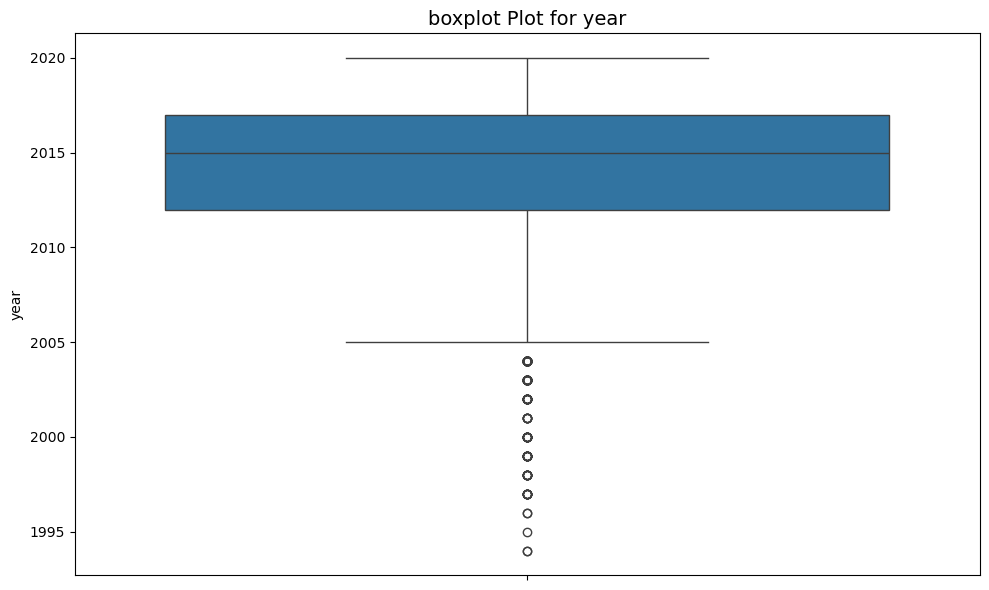

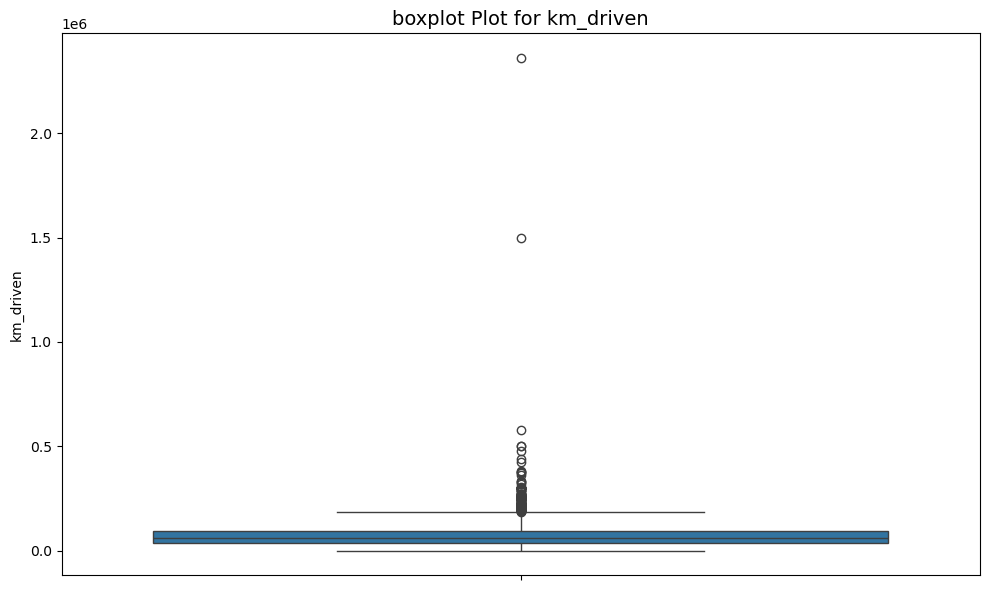

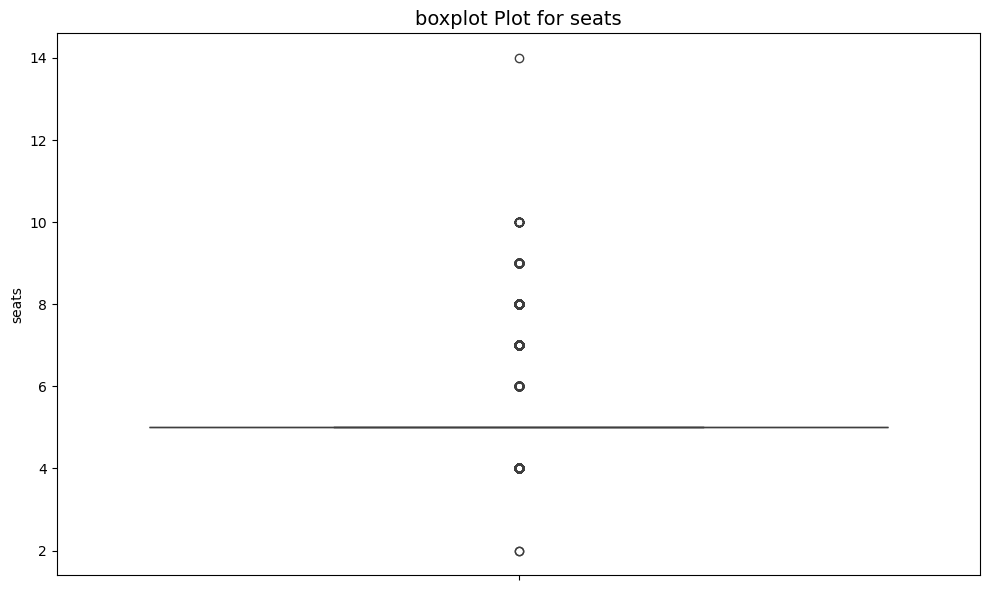

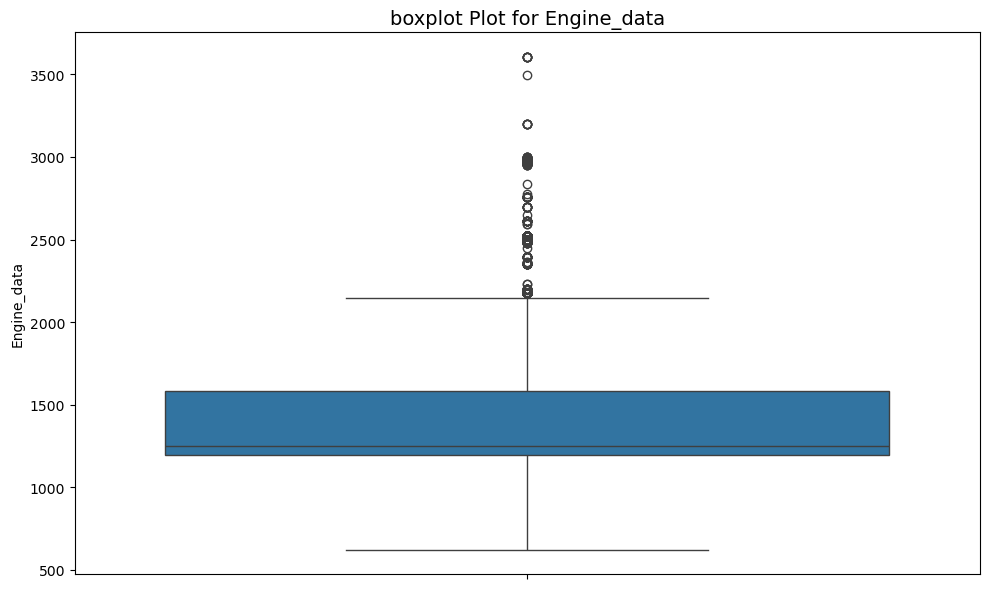

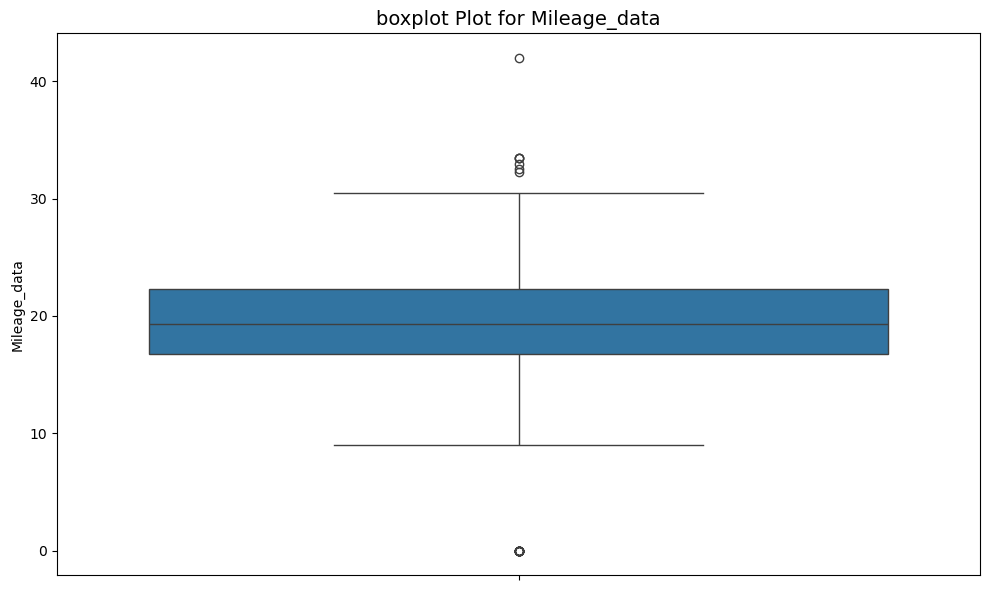

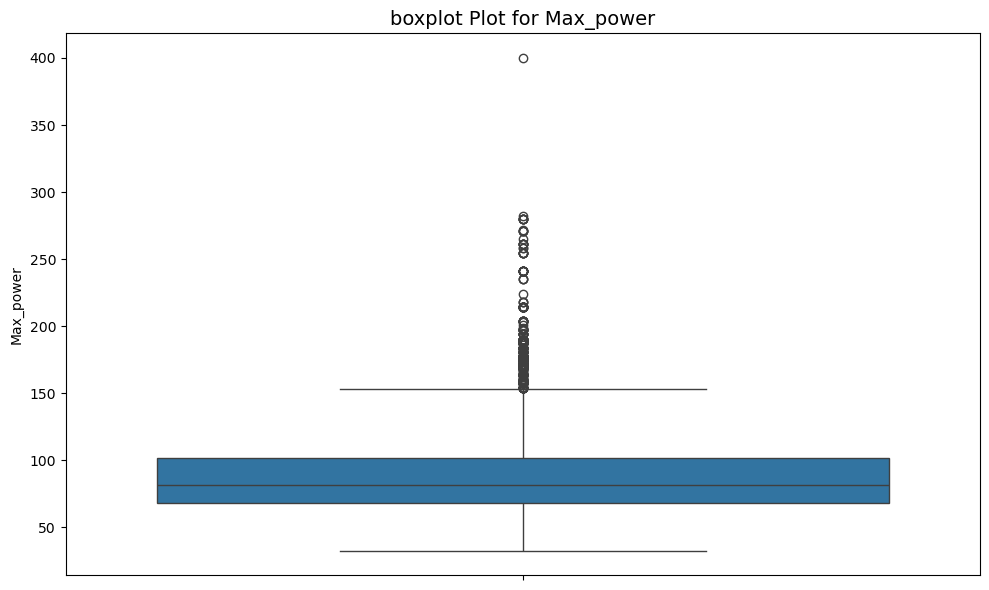

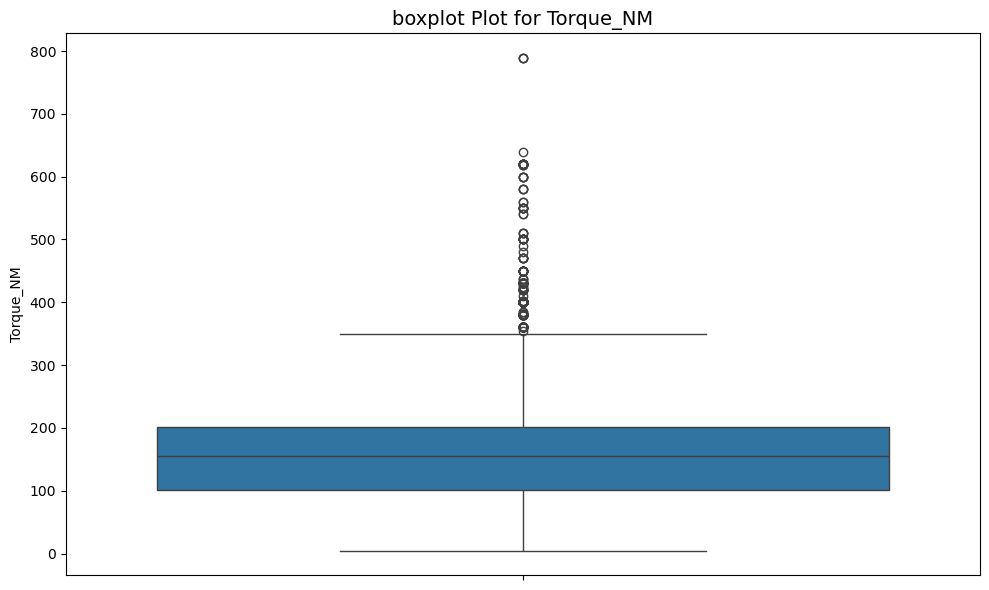

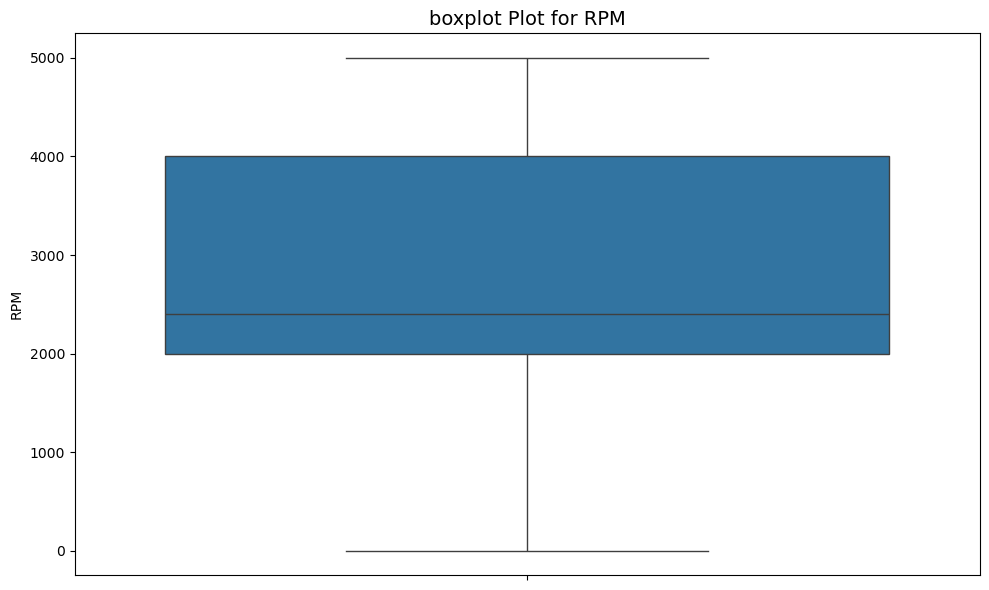

In [48]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [49]:
# Function to cap outliers using IQR
def cap_outliers_iqr(df):
    df_capped = df.copy()  # Make a copy to avoid modifying the original DataFrame

    # Loop through numeric columns and cap outliers based on IQR
    for column in df_capped.select_dtypes(include=[np.number]).columns:
        Q1 = df_capped[column].quantile(0.25)
        Q3 = df_capped[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Cap values outside the bounds to the lower or upper bound
        df_capped[column] = np.clip(df_capped[column], lower_bound, upper_bound)

    return df_capped

In [50]:
X = cap_outliers_iqr(X)

In [51]:
X.shape

(7906, 15)

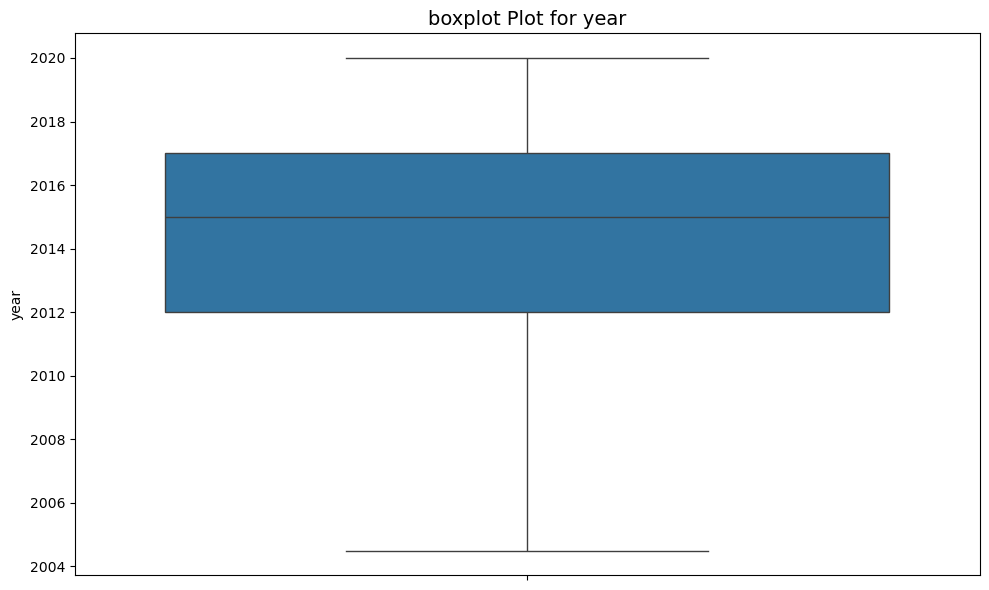

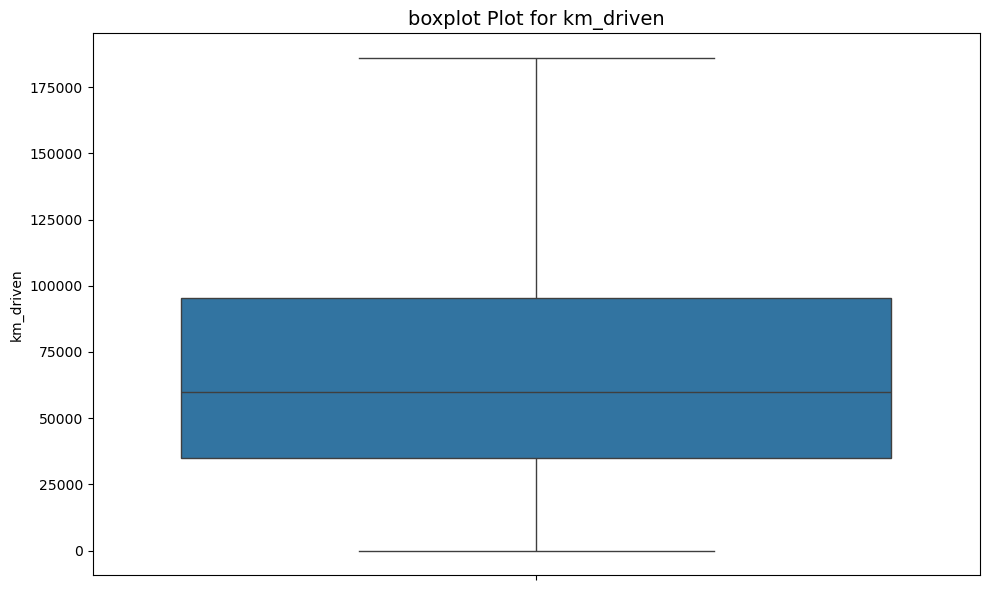

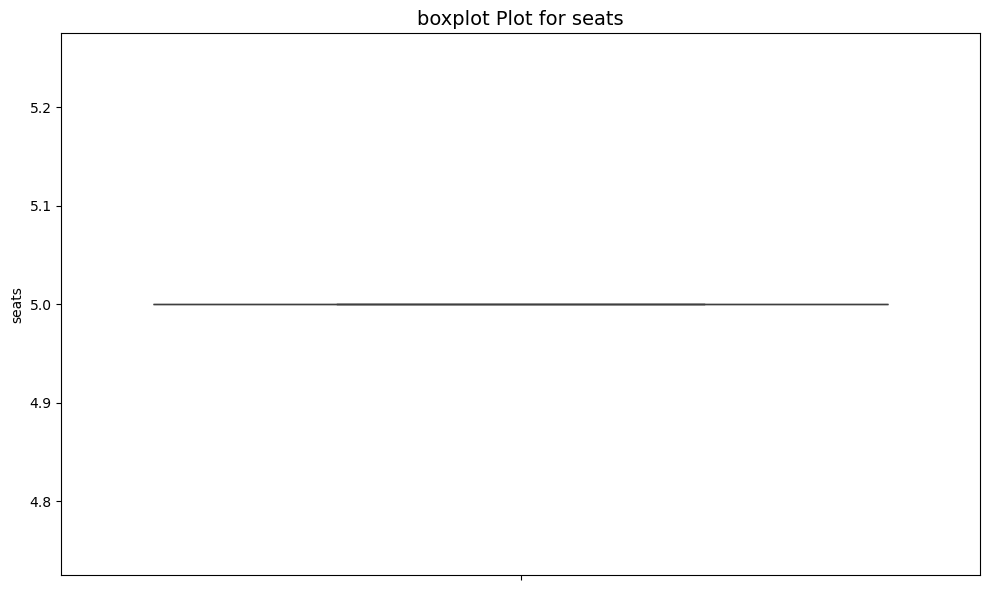

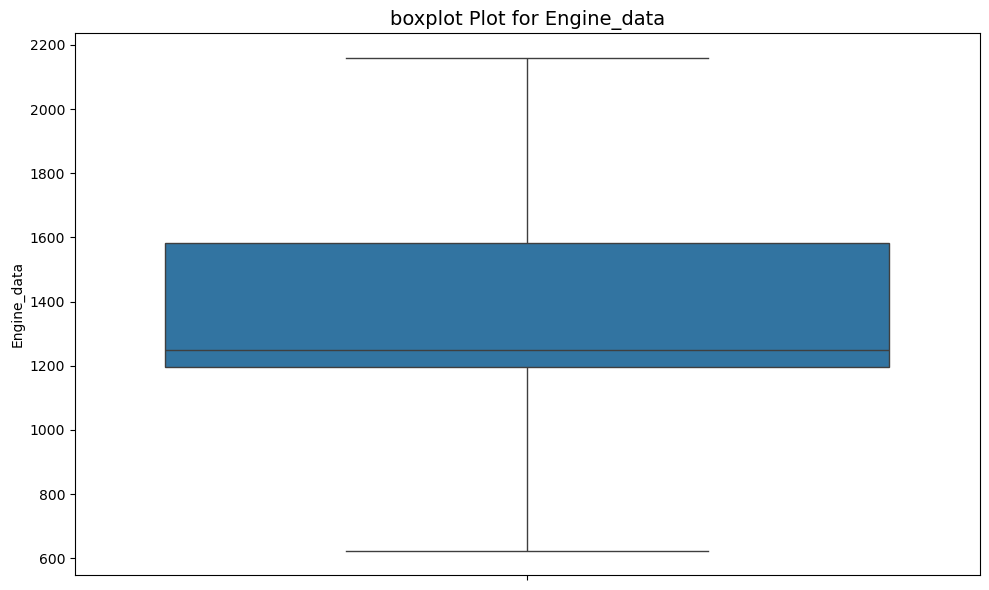

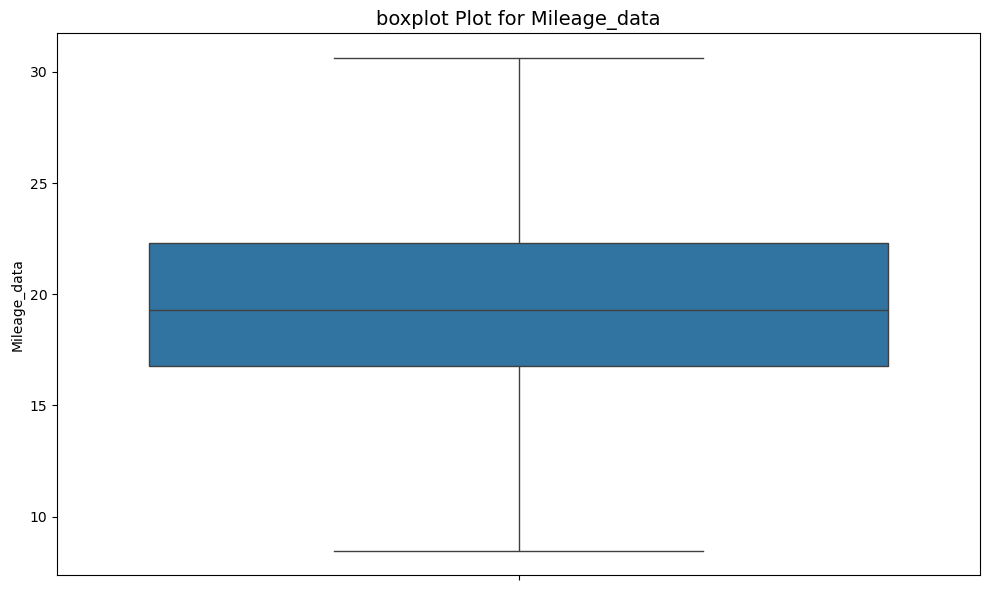

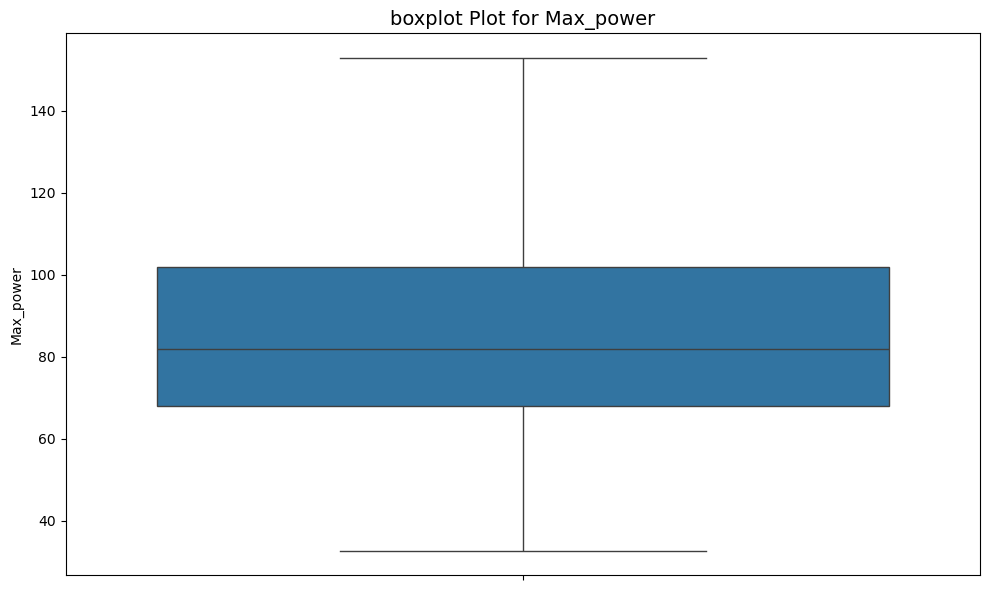

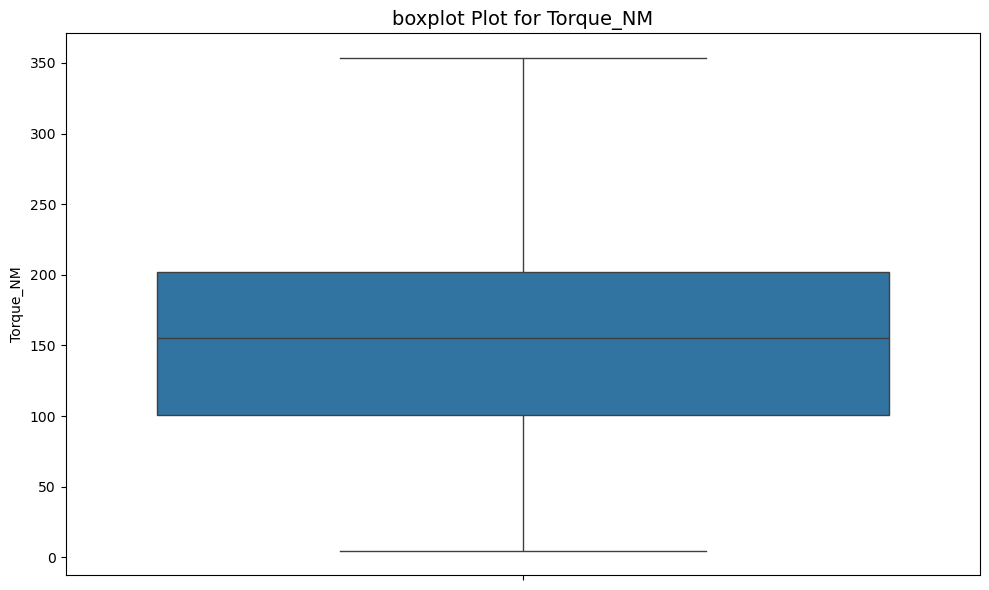

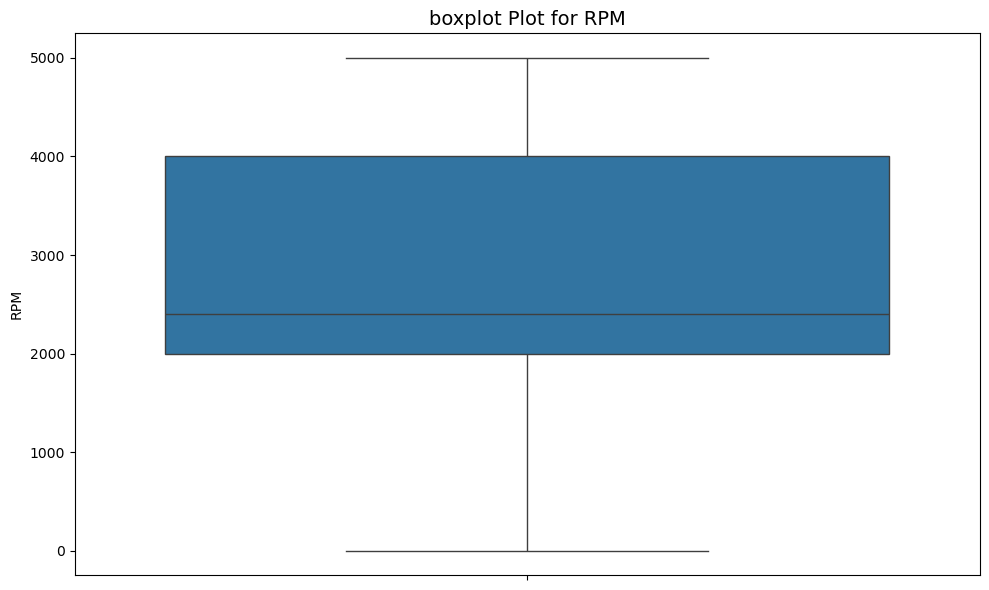

In [52]:
# Loop through each column in the DataFrame
for column in X.columns:
    if np.issubdtype(X[column].dtype, np.number):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        
        # KDE plot
        sns.boxplot(X[column])
        plt.title(f"boxplot Plot for {column}", fontsize=14)
    
        # plt.grid(alpha=0.3)
        plt.tight_layout()
        plt.show()

In [53]:
# num_X = X.select_dtypes(include=['number'])
# cat_X = X.select_dtypes(exclude=['number'])

In [54]:
# cat_X.head(10)

In [55]:
# cat_encoded = pd.get_dummies(cat_X, drop_first=True,dtype=int)

In [56]:
# cat_encoded.head(10)

In [57]:
# cat_encoded.shape

In [58]:
categorical_columns = X.select_dtypes(include=['object', 'category']).columns
categorical_columns

Index(['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model',
       'Mileage_unit'],
      dtype='object')

In [59]:
# X_final = pd.concat([num_X,cat_encoded], axis=1)
X_final = pd.get_dummies(X,columns=['fuel', 'seller_type', 'transmission', 'owner', 'Brand', 'model','Mileage_unit'],dtype=float,drop_first=True)

In [60]:
X_final.sample(100)

year  km_driven  seats  Engine_data  Mileage_data  Max_power  \
5558  2012.0   102000.0    5.0       2159.5         12.80    102.000   
1910  2016.0   120000.0    5.0       2159.5         14.10    147.940   
349   2015.0    40000.0    5.0       1197.0         18.90     82.000   
3576  2016.0    15000.0    5.0       1199.0         23.84     84.000   
3450  2013.0    73000.0    5.0       2159.5         12.99    100.000   
2882  2015.0   137000.0    5.0       2159.5         12.99    100.600   
231   2015.0    80000.0    5.0       1198.0         19.49     67.040   
2506  2014.0    70000.0    5.0       1120.0         24.00     70.000   
984   2014.0    80000.0    5.0       2159.5         13.01    152.925   
4586  2017.0    70000.0    5.0       1498.0         25.80     98.600   
6133  2018.0    20375.0    5.0       1197.0         20.89     81.800   
5581  2013.0    40000.0    5.0       1197.0         20.36     78.900   
1942  2010.0   110000.0    5.0       1061.0         17.30     64.000   
7648  2016.0   120000.0    5.0       1198.0         25.32     77.000   
1207  2015.0    50000.0    5.0       1193.0         17.57     88.700   
4395  2019.0    10000.0    5.0       2159.5         13.80    152.925   
86    2016.0    38000.0    5.0        796.0         24.70     47.300   
2590  2012.0    90000.0    5.0       1461.0         21.64     84.800   
1002  2018.0    57000.0    5.0       1248.0         25.10     88.500   
598   2013.0   116104.0    5.0       1498.0         25.80     98.600   
7384  2016.0    35000.0    5.0        796.0         22.74     47.300   
4407  2012.0   135000.0    5.0       2159.5         13.93    138.030   
4605  2018.0    25000.0    5.0        998.0         20.30     68.050   
6957  2015.0    80000.0    5.0       2159.5         15.40    120.000   
562   2018.0    19100.0    5.0       1194.0         19.00     94.680   
5949  2005.0   186062.5    5.0       2159.5         12.80    102.000   
2483  2015.0    60000.0    5.0       1997.0         15.40    120.000   
5484  2015.0   140000.0    5.0       1498.0         25.10     98.600   
5957  2016.0    39000.0    5.0       1582.0         19.67    126.200   
1761  2019.0   100000.0    5.0       1197.0         20.14     81.860   
4988  2009.0    80000.0    5.0        796.0         16.10     37.000   
5539  2012.0   166000.0    5.0       1461.0         23.08     63.100   
4591  2012.0    90000.0    5.0       1248.0         23.20     73.940   
3577  2014.0   100000.0    5.0       2159.5         14.00     95.000   
5182  2014.0   121000.0    5.0       2159.5         12.99    100.600   
852   2007.0    90000.0    5.0       1493.0         16.80    110.000   
4205  2012.0    87237.0    5.0       1399.0         20.00     68.050   
6330  2010.0    77088.0    5.0       2159.5         14.00     95.000   
4487  2007.0   120000.0    5.0       1405.0         17.00     70.000   
7500  2019.0    24000.0    5.0       1248.0         28.40     74.020   
4231  2019.0     7032.0    5.0       1199.0         19.00     88.760   
785   2009.0    90000.0    5.0       1086.0          8.47     62.000   
3178  2015.0    92651.0    5.0       1498.0         21.70     98.960   
5621  2018.0    38817.0    5.0       1248.0         27.39     74.000   
3791  2013.0    56315.0    5.0        936.0         25.44     57.600   
1152  2018.0     2000.0    5.0       1984.0         16.80    150.000   
7684  2008.0    80000.0    5.0        995.0         16.00     63.000   
822   2013.0    90000.0    5.0        998.0         20.51     67.040   
5471  2009.0    50000.0    5.0        998.0         19.00     66.100   
41    2019.0     5000.0    5.0       1368.0         16.00    152.925   
6898  2016.0    23700.0    5.0       1197.0         20.40     81.800   
1978  2020.0     5500.0    5.0       1597.0         26.80    118.000   
6718  2010.0    80000.0    5.0       1086.0         19.81     68.050   
4858  2018.0    15000.0    5.0       1199.0         18.10     88.700   
7887  2015.0    80000.0    5.0       2159.5     

In [61]:
X_final['RPM'] = X_final['RPM'].ffill()

In [62]:
X_final.isnull().sum()

year                                                   0
km_driven                                              0
seats                                                  0
Engine_data                                            0
Mileage_data                                           0
Max_power                                              0
Torque_NM                                              0
RPM                                                    0
fuel_Diesel                                            0
fuel_LPG                                               0
fuel_Petrol                                            0
seller_type_Individual                                 0
seller_type_Trustmark Dealer                           0
transmission_Manual                                    0
owner_Fourth & Above Owner                             0
owner_Second Owner                                     0
owner_Test Drive Car                                   0
owner_Third Owner              

In [63]:
X_final.shape

(7906, 2030)

In [64]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_final,y,test_size=0.2,random_state=42)

In [65]:
X_train.dtypes

year                                                   float64
km_driven                                              float64
seats                                                  float64
Engine_data                                            float64
Mileage_data                                           float64
Max_power                                              float64
Torque_NM                                              float64
RPM                                                    float64
fuel_Diesel                                            float64
fuel_LPG                                               float64
fuel_Petrol                                            float64
seller_type_Individual                                 float64
seller_type_Trustmark Dealer                           float64
transmission_Manual                                    float64
owner_Fourth & Above Owner                             float64
owner_Second Owner                                     

In [66]:
X_train.shape , y_train.shape , X_test.shape , y_test.shape

((6324, 2030), (6324,), (1582, 2030), (1582,))

In [67]:
X_train.sample(40)

year  km_driven  seats  Engine_data  Mileage_data  Max_power  \
372   2017.0    45000.0    5.0       1999.0         19.33    152.925   
2104  2015.0   145000.0    5.0       1582.0         22.70    126.200   
911   2017.0    80000.0    5.0       1248.0         22.95     74.000   
4528  2018.0    12800.0    5.0       1496.0         17.80    105.500   
947   2015.0    55000.0    5.0        936.0         25.44     56.300   
822   2013.0    90000.0    5.0        998.0         20.51     67.040   
657   2017.0    25538.0    5.0       1496.0         16.78     88.730   
6636  2017.0    30000.0    5.0       1197.0         18.60     81.830   
828   2017.0    35000.0    5.0       1582.0         23.90    126.200   
4371  2012.0   120000.0    5.0        814.0         21.10     55.200   
543   2013.0   186062.5    5.0       2159.5         12.99    100.600   
5402  2017.0    34000.0    5.0       1197.0         21.40     83.100   
7561  2018.0    20000.0    5.0       2159.5         13.68    147.800   
109   2010.0    48000.0    5.0       1172.0         15.80     65.000   
4113  2010.0   110000.0    5.0       1248.0         17.80     75.000   
4869  2016.0    25000.0    5.0        796.0         22.74     47.300   
1674  2016.0    97000.0    5.0       1968.0         16.96    138.030   
1881  2018.0    40000.0    5.0       1248.0         28.09     88.500   
5310  2019.0     5000.0    5.0       1199.0         19.50     88.760   
913   2014.0    18945.0    5.0        814.0         21.10     55.200   
8111  2014.0    50000.0    5.0       1364.0         23.59     67.060   
5824  2012.0   120000.0    5.0       1598.0         20.54    103.600   
5784  2016.0    47370.0    5.0       1196.0         21.94     63.000   
3888  2011.0   186062.5    5.0       2159.5         12.80    102.000   
3952  2013.0    85000.0    5.0       1461.0         23.08     63.120   
3687  2018.0    13000.0    5.0       2159.5         17.00    139.010   
2020  2018.0     7800.0    5.0       1199.0         17.50     88.700   
3992  2013.0    87452.0    5.0       1498.0         22.77     98.590   
5253  2019.0     8500.0    5.0       1995.0         16.78    152.925   
5916  2007.0    70000.0    5.0       1497.0         17.70     78.000   
1577  2014.0    79011.0    5.0       1497.0         18.00    117.300   
3016  2009.0    89322.0    5.0       1197.0         17.00     80.000   
7107  2018.0    27000.0    5.0       1248.0         24.30     88.500   
7269  2016.0    40000.0    5.0        998.0         23.95     67.050   
4696  2009.0    70000.0    5.0       1248.0         19.30     73.900   
7023  2012.0    51856.0    5.0       1197.0         18.50     80.000   
375   2016.0    68089.0    5.0       2159.5         19.16    152.925   
6556  2017.0    45000.0    5.0       1999.0         19.33    152.925   
4219  2019.0    20000.0    5.0       1969.0         18.00    152.925   
3337  2016.0   110000.0    5.0       1248.0         24.30     88.500   

      Torque_NM     RPM  fuel_Diesel  fuel_LPG  fuel_Petrol  \
372      353.50  2125.0          1.0       0.0          0.0   
2104     259.88  2325.0          1.0       0.0          0.0   
911      190.00  2375.0          1.0       0.0          0.0   
4528     140.00  4200.0          0.0       0.0          1.0   
947      142.50  1750.0          1.0       0.0          0.0   
822       90.00  3500.0          0.0       0.0          1.0   
657      132.00  3000.0          0.0       0.0          1.0   
6636     114.70  4000.0          0.0       0.0          1.0   
828      259.90  2325.0          1.0       0.0          0.0   
4371      74.50  4000.0          0.0       0.0          1.0   
543      200.00  2400.0          1.0       0.0          0.0   
5402     115.00  4000.0          0.0       0.0          1.0   
7561     343.00  2100.0          1.0       0.0          0.0   
109       96.00  3000.0          0.0       0.0          1.0   
4113     190.00  2000.0          1.0       0.0          0.0   
4869      69.00  3500.0          0.0       0.0 

In [140]:
X_train.shape

(6324, 2030)

In [136]:
# Importing the Keras libraries and packages
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

In [138]:
# Initialising the ANN
classifier = Sequential()

In [142]:
# Adding the input layer and the first hidden layer
classifier.add(Dense(units=1015, kernel_initializer='he_uniform', activation='relu', input_dim=2030))
classifier.add(Dense(units=2030, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=1015, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=514, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=207, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=103, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=52, kernel_initializer='he_uniform', activation='relu'))
classifier.add(Dense(units=1, kernel_initializer='glorot_uniform', activation='linear'))

C:\Users\parvez\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [144]:
# Compiling the ANN
classifier.compile(optimizer = 'Adamax', loss = 'mean_squared_error', metrics = ['mean_absolute_error'])

In [146]:
# Fitting the ANN to the Training set
model_history = classifier.fit(X_train, y_train, validation_split=0.33, batch_size=10, epochs=100)

Epoch 1/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 49s 107ms/step - loss: 675736518656.0000 - mean_absolute_error: 441624.5312 - val_loss: 454951272448.0000 - val_mean_absolute_error: 391227.6875
Epoch 2/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 42s 99ms/step - loss: 359201472512.0000 - mean_absolute_error: 335335.0000 - val_loss: 358197264384.0000 - val_mean_absolute_error: 307602.3125
Epoch 3/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 45s 107ms/step - loss: 343843209216.0000 - mean_absolute_error: 317802.6562 - val_loss: 313060687872.0000 - val_mean_absolute_error: 308083.3750
Epoch 4/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 77s 96ms/step - loss: 278380249088.0000 - mean_absolute_error: 299562.5000 - val_loss: 291152232448.0000 - val_mean_absolute_error: 276688.2812
Epoch 5/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 47s 110ms/step - loss: 245761736704.0000 - mean_absolute_error: 274577.4688 - val_loss: 259506667520.0000 - val_mean_absolute_error: 283115.5000
Epoch 6/100
424/424 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - loss: 23771003

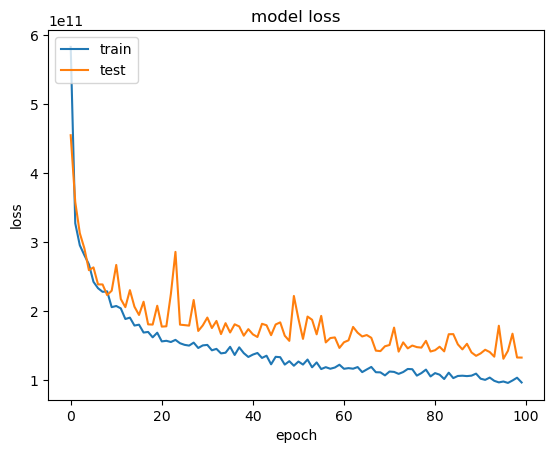

In [156]:
# summarize history for loss
plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

dict_keys(['loss', 'mean_absolute_error', 'val_loss', 'val_mean_absolute_error'])


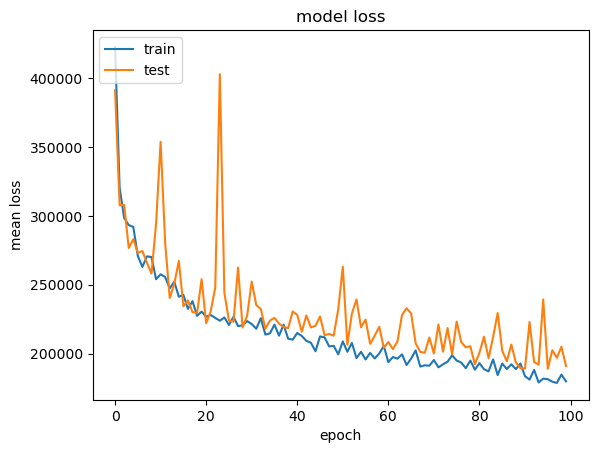

In [162]:
# list all data in history

print(model_history.history.keys())
# summarize history for accuracy
plt.plot(model_history.history['mean_absolute_error'])
plt.plot(model_history.history['val_mean_absolute_error'])
plt.title('model loss')
plt.ylabel('mean loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [164]:
# Predicting the Test set results
y_pred = classifier.predict(X_test)

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


In [168]:
from sklearn.metrics import mean_squared_error, r2_score
score_test_l = r2_score(y_pred,y_test)
print(" Test accuracy : ",score_test_l)

 Test accuracy :  0.8183392882347107


In [179]:
!pip install keras-tuner --upgrade

# using keras Tuner

In [224]:
import pandas as pd
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch

In [226]:
def build_model(hp):
    model = keras.Sequential()
    for i in range(hp.Int('num_layers', 2, 20)):
        model.add(layers.Dense(units=hp.Int('units_' + str(i),
                                            min_value=32,
                                            max_value=512,
                                            step=32),
                               activation='relu'))
    model.add(layers.Dense(1, activation='linear'))
    model.compile(
        optimizer=keras.optimizers.Adam(
            hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mean_absolute_error',
        metrics=['mean_absolute_error'])
    return model

In [228]:
tuner = RandomSearch(
    build_model,
    objective='val_mean_absolute_error',
    max_trials=5,
    executions_per_trial=3,
    directory='car_price_keras_tuner',
    project_name='Car_price_using_keras_tuner')

Reloading Tuner from car_price_keras_tuner\Car_price_using_keras_tuner\tuner0.json


In [230]:
tuner.search_space_summary()

Search space summary
Default search space size: 21
num_layers (Int)
{'default': None, 'conditions': [], 'min_value': 2, 'max_value': 20, 'step': 1, 'sampling': 'linear'}
units_0 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_1 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
learning_rate (Choice)
{'default': 0.01, 'conditions': [], 'values': [0.01, 0.001, 0.0001], 'ordered': True}
units_2 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_3 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_4 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_5 (Int)
{'default': None, 'conditions': [], 'min_value': 32, 'max_value': 512, 'step': 32, 'sampling': 'linear'}
units_6

In [232]:
tuner.search(X_train, y_train,
             epochs=50,
             validation_data=(X_test, y_test))

In [234]:
best_hps = tuner.get_best_hyperparameters(num_trials=3)[0]
best_model = tuner.hypermodel.build(best_hps)
best_model.fit(X_train, y_train, epochs=100, validation_data=(X_test, y_test))

Epoch 1/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - loss: 472041.5938 - mean_absolute_error: 472041.5938 - val_loss: 318744.5000 - val_mean_absolute_error: 318744.5000
Epoch 2/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 300095.9062 - mean_absolute_error: 300095.9062 - val_loss: 268454.2188 - val_mean_absolute_error: 268454.2188
Epoch 3/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 263436.1875 - mean_absolute_error: 263436.1875 - val_loss: 274425.6250 - val_mean_absolute_error: 274425.6250
Epoch 4/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 273245.3125 - mean_absolute_error: 273245.3125 - val_loss: 256648.5938 - val_mean_absolute_error: 256648.5938
Epoch 5/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 247811.9531 - mean_absolute_error: 247811.9531 - val_loss: 270499.6562 - val_mean_absolute_error: 270499.6562
Epoch 6/100
198/198 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 251333.4844 - mean_absolute_error: 251333.4844 - val_loss: 270671.9375 - val_mean_ab

In [235]:
y_pred = best_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R² Score:",r2)

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
R² Score: 0.8812211751937866
